In [1]:
# =========================
# CELL A: SET PATHS
# =========================


phy_path = r"C:\Users\Shermanlab\Desktop\2026-02-26_14-01-37\Record Node 101\experiment1\recording1\continuous\Neuropix-PXI-100.ProbeA\kilosort4"##########################################################################################################################################################

ni_folder = r"C:\Users\Shermanlab\Desktop\2026-02-26_14-01-37\Record Node 104\experiment1\recording1\events\NI-DAQmx-103.PXIe-6341\TTL"####################################################################################################################################################################

print("NI folder:")
print(ni_folder)

print("\nPhy path:")
print(phy_path)

NI folder:
C:\Users\Shermanlab\Desktop\2026-02-26_14-01-37\Record Node 104\experiment1\recording1\events\NI-DAQmx-103.PXIe-6341\TTL

Phy path:
C:\Users\Shermanlab\Desktop\2026-02-26_14-01-37\Record Node 101\experiment1\recording1\continuous\Neuropix-PXI-100.ProbeA\kilosort4


In [2]:
# =========================
# CELL B: load data/units
# =========================

import pandas as pd
import os
import spikeinterface.extractors as se

sorting = se.read_phy(phy_path)   # <-- REQUIRED

cg_path = os.path.join(phy_path, "cluster_group.tsv")
df = pd.read_csv(cg_path, sep="\t")

print(df.head())
print("\nColumns:", df.columns)

print("Sorting unit IDs (first 20):")
print(sorting.get_unit_ids()[:20])
print(df['group'].value_counts())


   cluster_id  group
0           0  noise
1           1  noise
2           2  noise
3           3   good
4           4  noise

Columns: Index(['cluster_id', 'group'], dtype='object')
Sorting unit IDs (first 20):
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
group
noise    342
good      82
Name: count, dtype: int64


In [9]:
# ============================================================
# CELL C‑COMPUTE: TTL + SPIKES + PETH (COMPUTATION ONLY)
# ============================================================

import numpy as np
from scipy.ndimage import gaussian_filter1d
import spikeinterface.extractors as se
import pandas as pd
import os

# ============================================================
# TUNABLE PARAMETERS (EDIT THESE ONLY)
# ============================================================

BIT_NUMBER = 7  ##################################################################################################################################################################################################################################################################################################
# TTL bit to extract

T_BEFORE = 5.0  ##################################################################################################################################################################################################################################################################################################
T_AFTER  = 10.0 ##################################################################################################################################################################################################################################################################################################
# PETH window around TTL

BIN_WIDTH = 0.2  ##################################################################################################################################################################################################################################################################################################
SIGMA_BINS = 2.0  ##################################################################################################################################################################################################################################################################################################
# Smoothing for trial-by-trial PETH

BASELINE_START = -5.0  ##################################################################################################################################################################################################################################################################################################
BASELINE_END   = -3.0 ##################################################################################################################################################################################################################################################################################################
# Baseline window for z-scoring

Z_THRESH = 1.96  ##################################################################################################################################################################################################################################################################################################
# Significance threshold for z-score PETH

# ============================================================
# 1. LOAD TTL
# ============================================================

timestamps_ni = np.load(os.path.join(ni_folder, "timestamps.npy"))
full_words_ni = np.load(os.path.join(ni_folder, "full_words.npy"))

mask = 1 << BIT_NUMBER
bit_on = (full_words_ni & mask) > 0
bit_on_prev = np.roll(bit_on, 1)
bit_on_prev[0] = False

rising_idx = (~bit_on_prev) & (bit_on)
event_times = timestamps_ni[rising_idx]

print(f"TTL pulses extracted: {len(event_times)}")

# ============================================================
# 2. LOAD SORTING + CURATED GOOD UNITS
# ============================================================

sorting = se.read_phy(phy_path)

df = pd.read_csv(os.path.join(phy_path, "cluster_group.tsv"), sep="\t")
good_cluster_ids = set(df[df["group"] == "good"]["cluster_id"].values)

unit_ids_all = sorting.get_unit_ids()
good_units = [u for u in unit_ids_all if u in good_cluster_ids]

sorting_good = sorting.select_units(good_units)
unit_ids = sorting_good.get_unit_ids()
sf = sorting_good.get_sampling_frequency()

print(f"Good units: {len(unit_ids)}")

# ============================================================
# 3. PREPARE BINS + MASKS
# ============================================================

bins = np.arange(-T_BEFORE, T_AFTER + BIN_WIDTH, BIN_WIDTH)
bin_centers = bins[:-1] + BIN_WIDTH / 2
n_bins = len(bin_centers)

baseline_mask = (bin_centers >= BASELINE_START) & (bin_centers < BASELINE_END)

# ============================================================
# 4. COMPUTE TRIAL MATRICES FOR EACH UNIT
# ============================================================

results = {}   # store everything here

for unit in unit_ids:

    spike_times = sorting_good.get_unit_spike_train(unit) / sf

    trial_matrix = np.zeros((len(event_times), n_bins))       # z-score
    trial_matrix_hz = np.zeros((len(event_times), n_bins))    # Hz
    aligned_spikes = []

    for i, t in enumerate(event_times):

        rel = spike_times - t
        window = rel[(rel > -T_BEFORE) & (rel < T_AFTER)]
        aligned_spikes.append(window)

        counts, _ = np.histogram(window, bins=bins)
        fr = counts / BIN_WIDTH
        fr_smooth = gaussian_filter1d(fr.astype(float), sigma=SIGMA_BINS)

        trial_matrix_hz[i] = fr_smooth

        baseline_vals = fr_smooth[baseline_mask]
        mu = baseline_vals.mean()
        sigma = baseline_vals.std()

        if sigma < 1e-6:
            trial_matrix[i] = 0.0
        else:
            trial_matrix[i] = (fr_smooth - mu) / sigma

    # store results
    results[unit] = {
        "aligned_spikes": aligned_spikes,
        "trial_matrix": trial_matrix,
        "trial_matrix_hz": trial_matrix_hz,
        "mean_peth": trial_matrix.mean(axis=0),
        "sem_peth": trial_matrix.std(axis=0) / np.sqrt(len(event_times)),
        "mean_peth_hz": trial_matrix_hz.mean(axis=0),
        "sem_peth_hz": trial_matrix_hz.std(axis=0) / np.sqrt(len(event_times)),
    }

print("✅ Computation complete. Ready to plot.")


TTL pulses extracted: 11
Good units: 82
✅ Computation complete. Ready to plot.


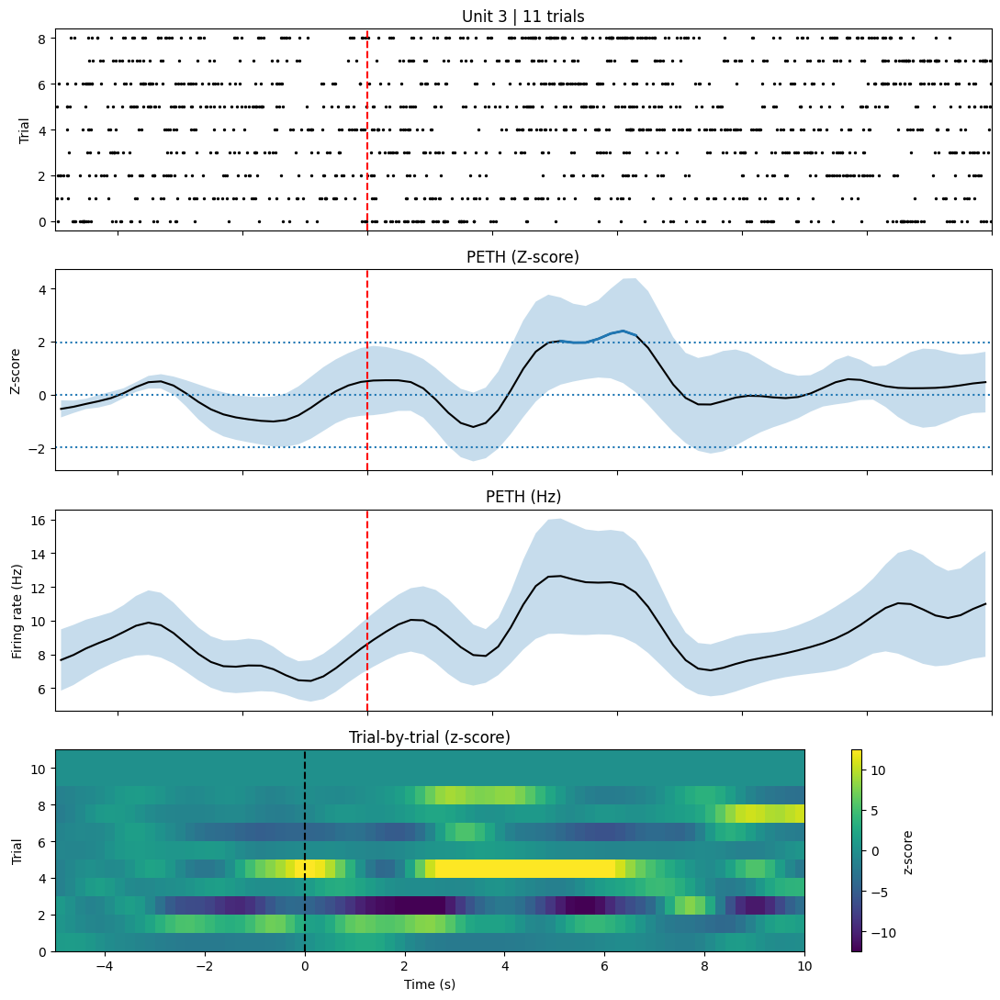

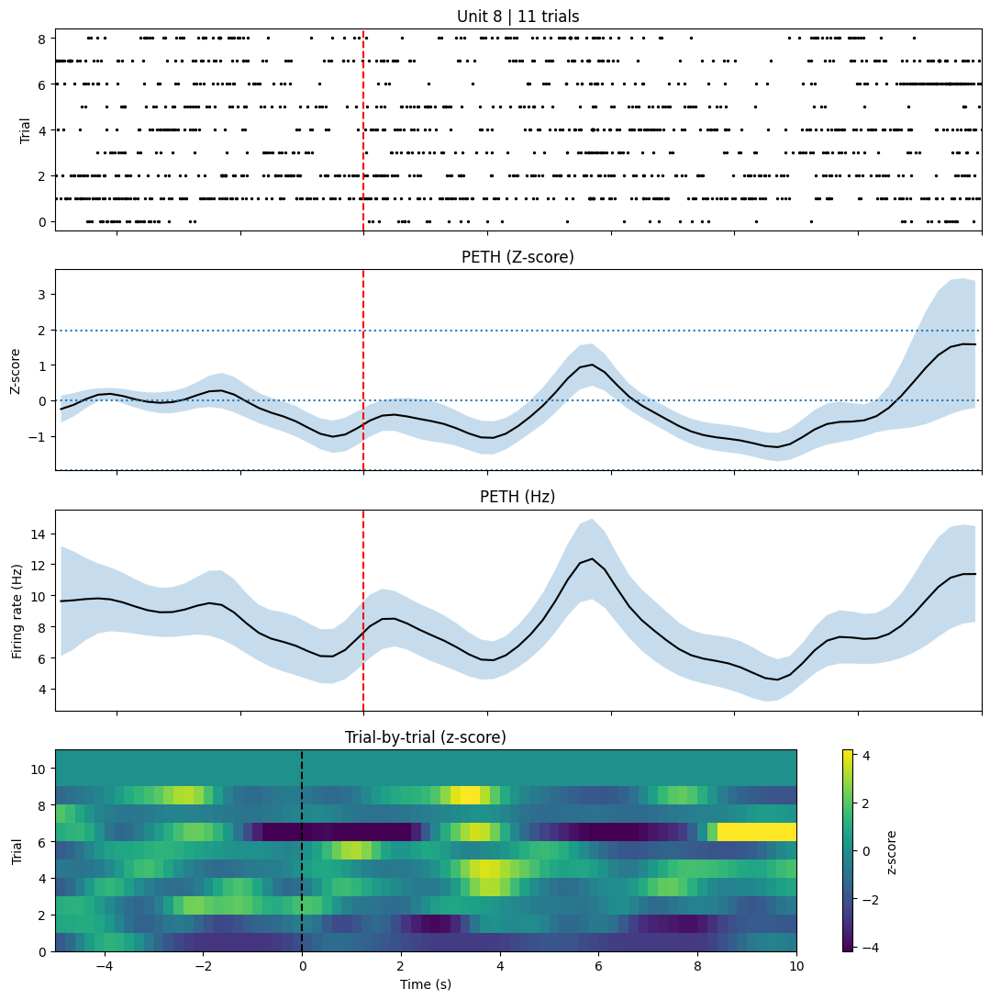

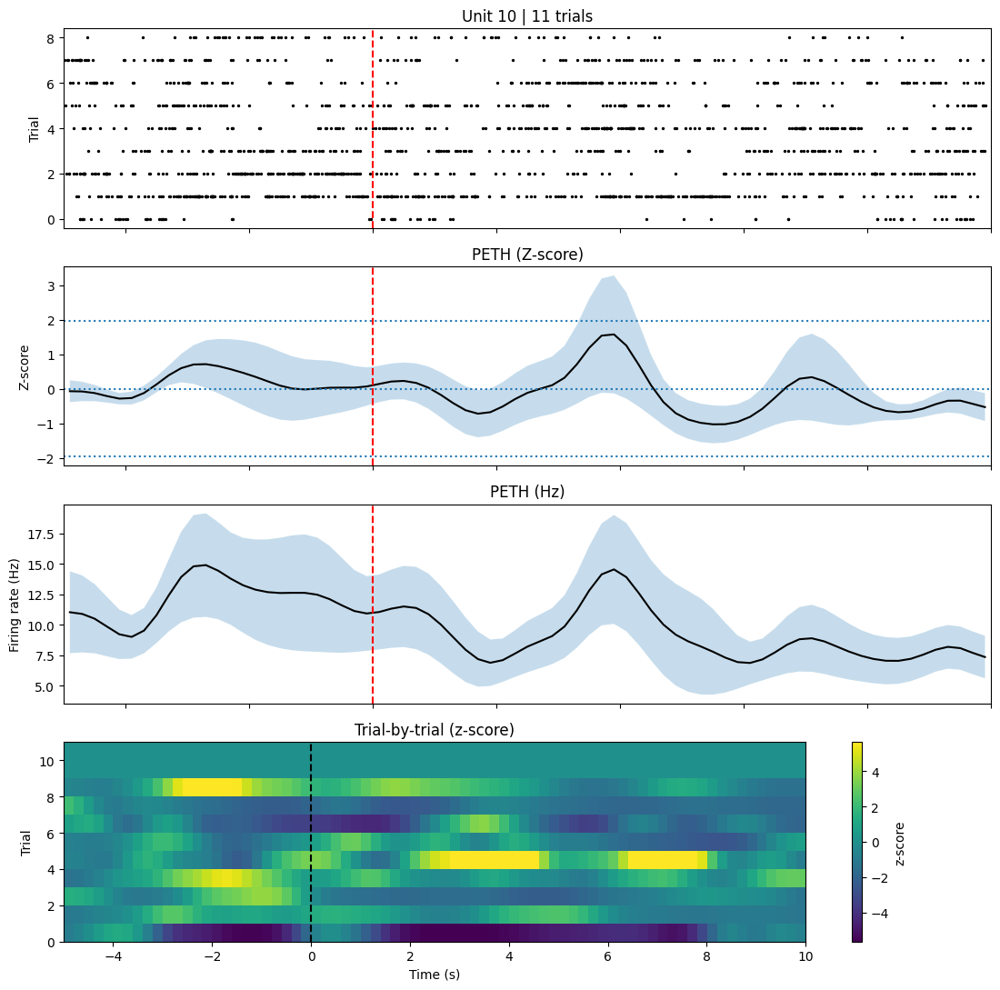

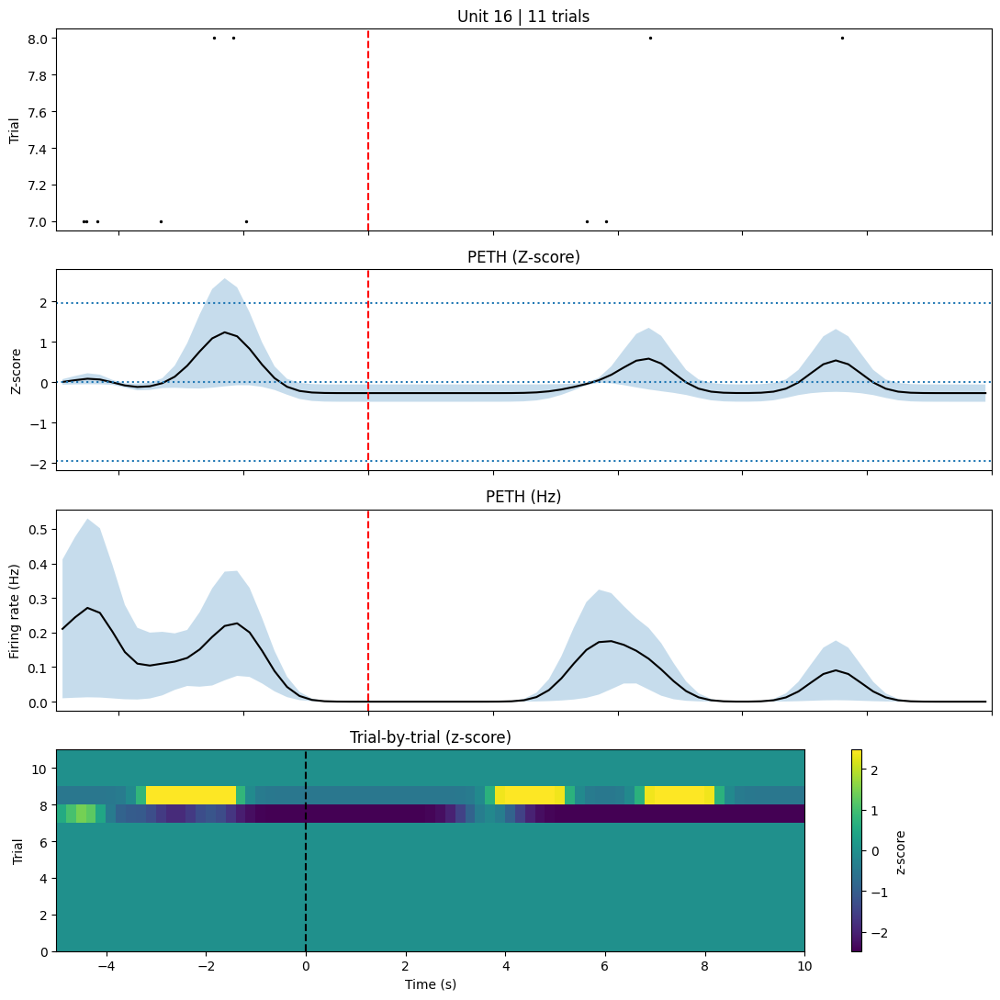

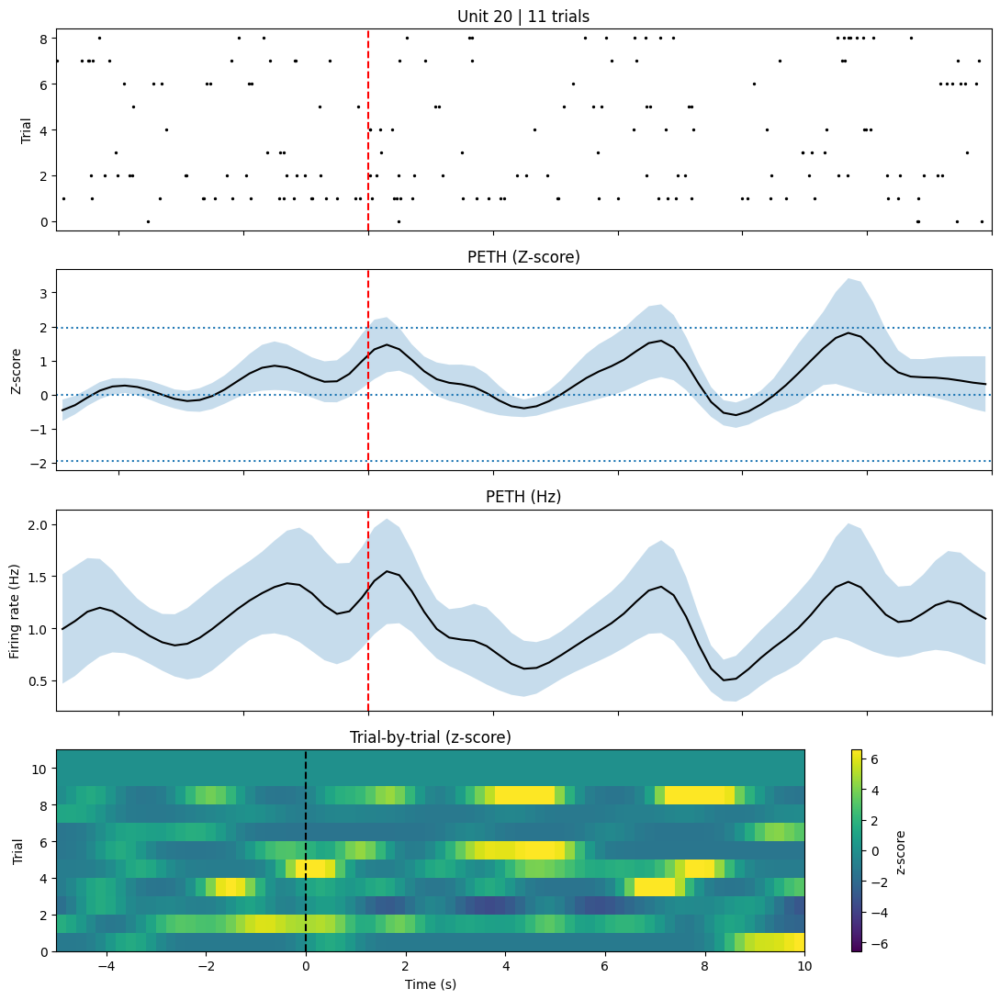

...

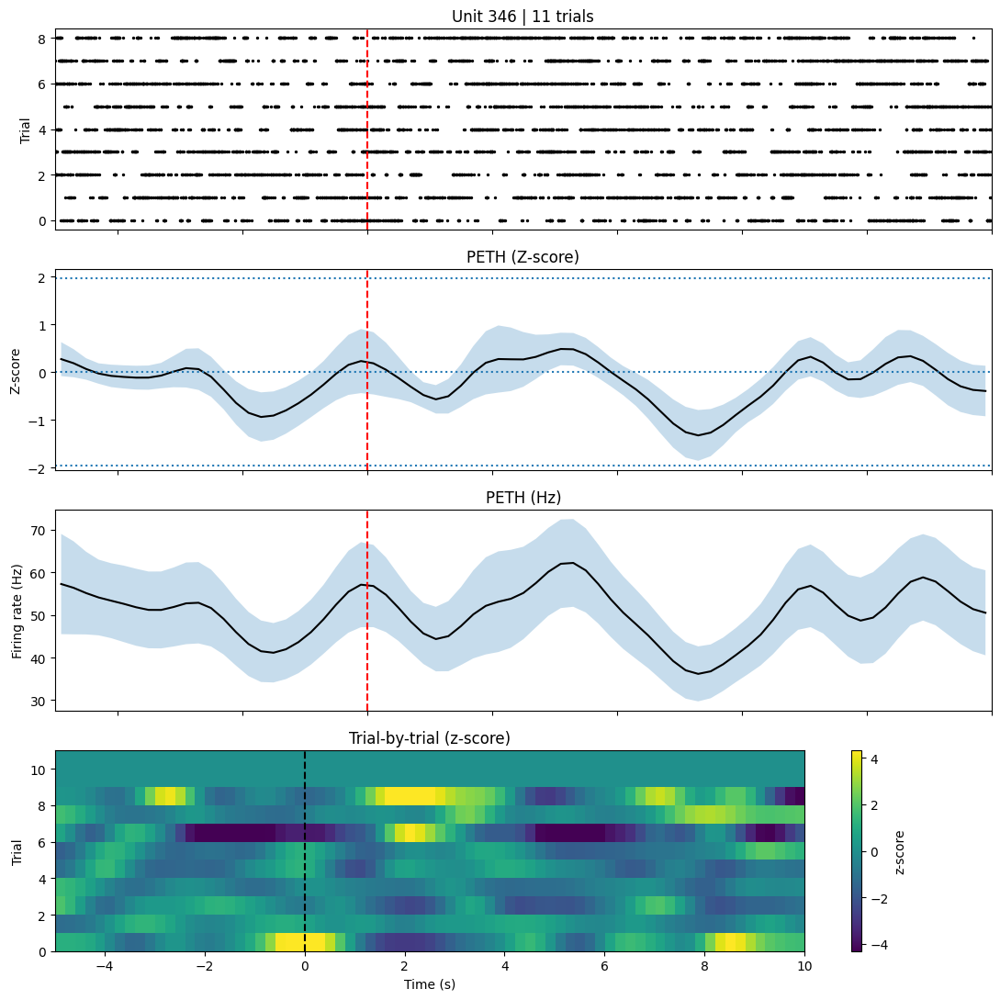

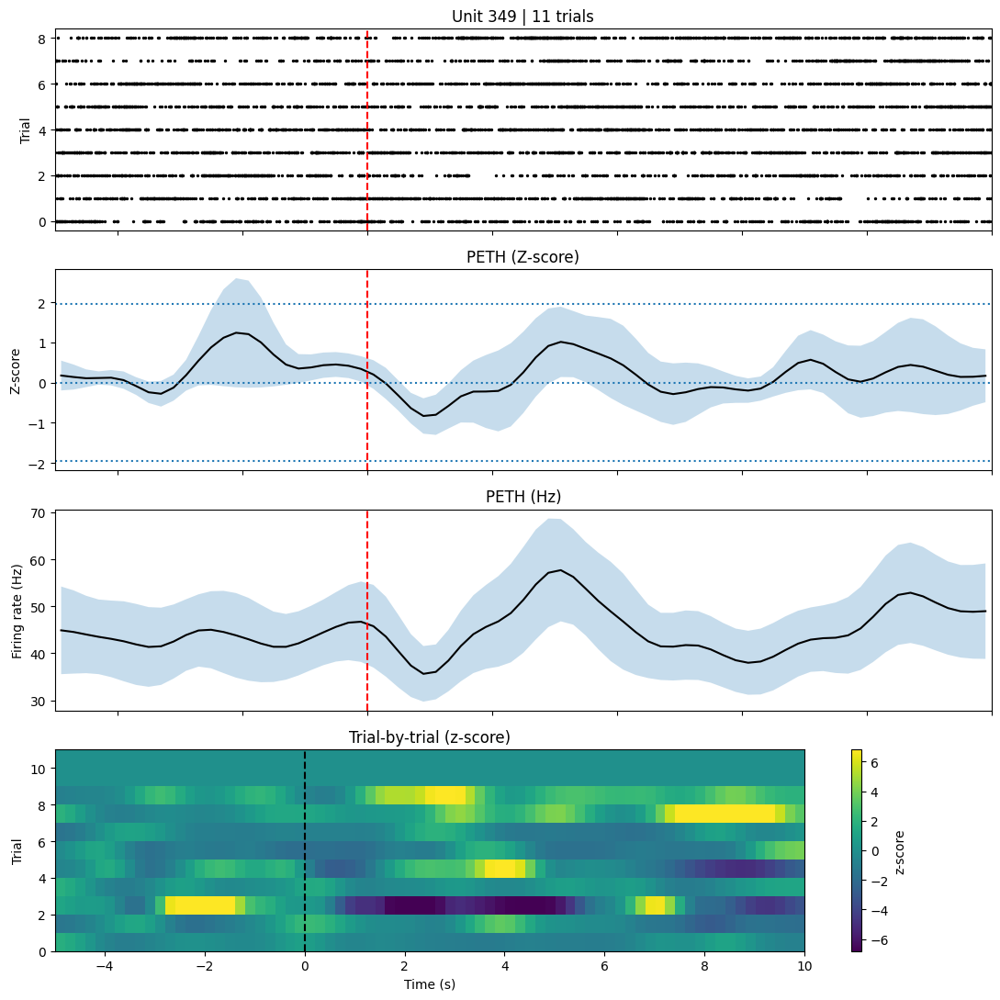

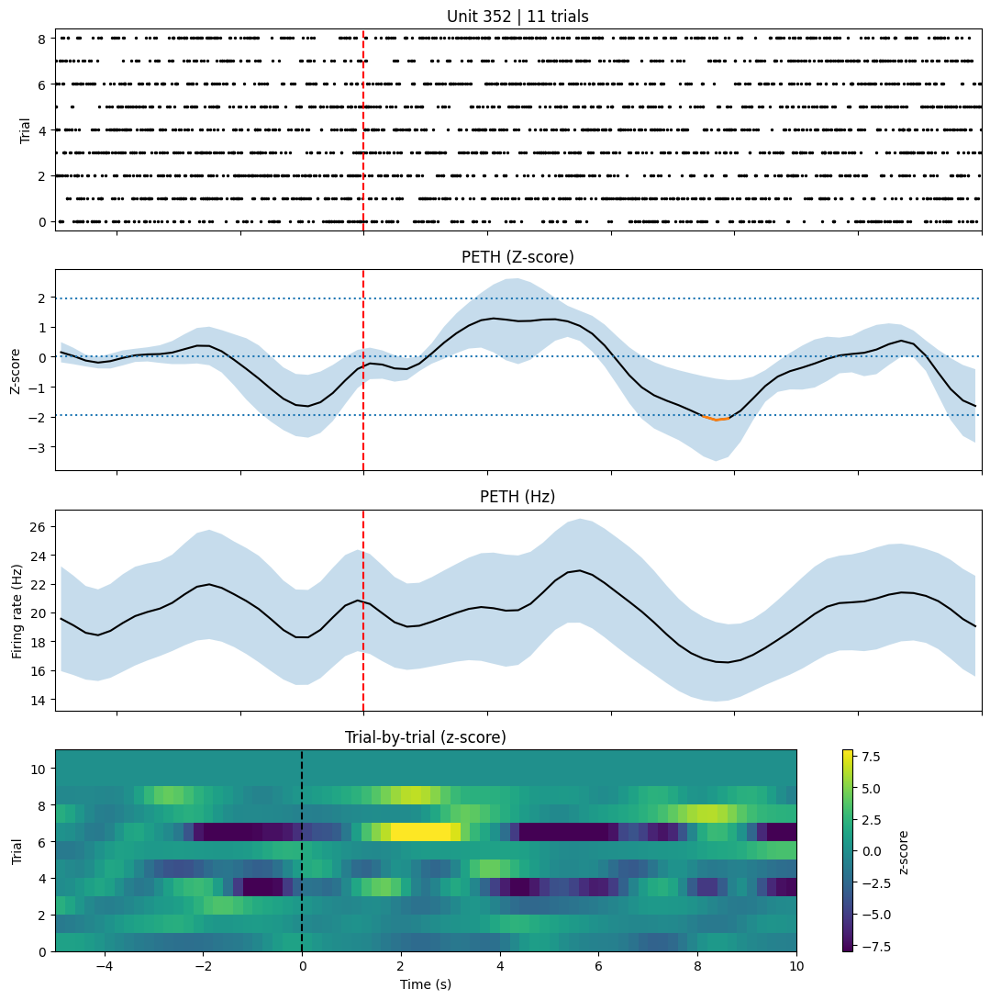

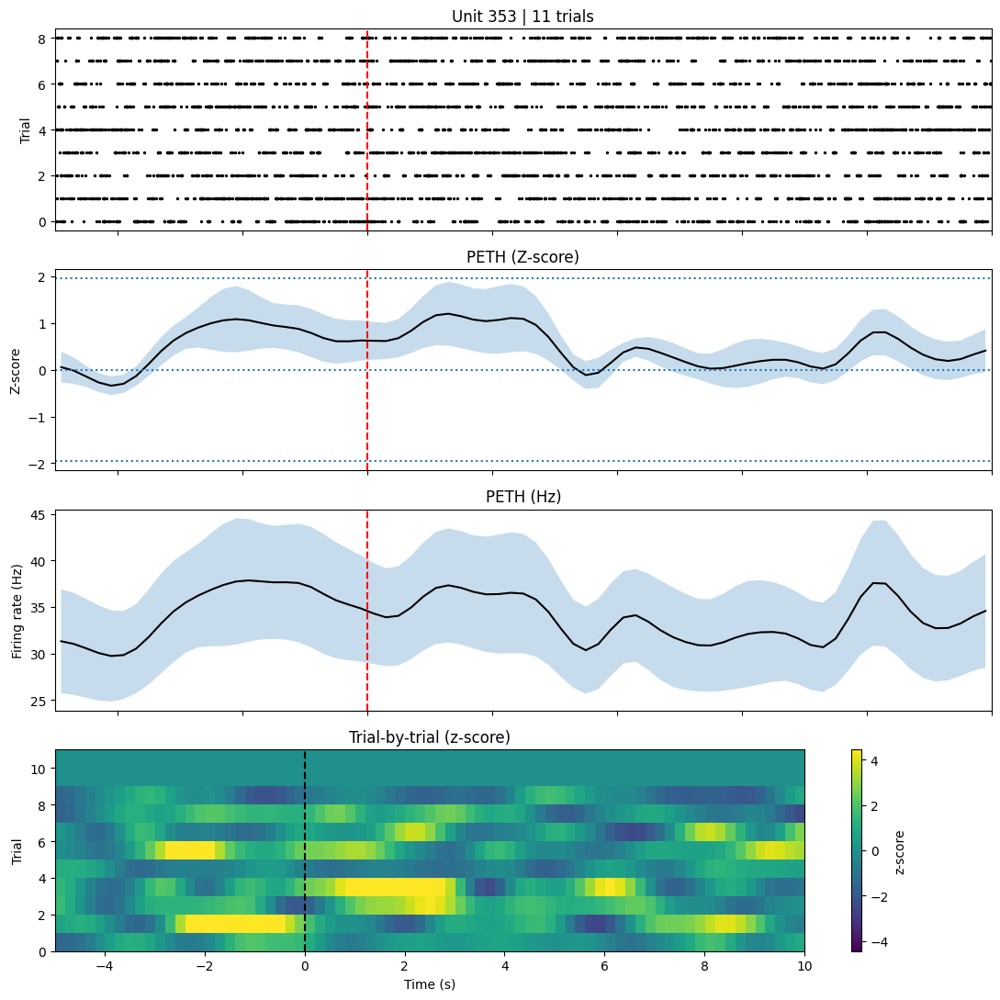

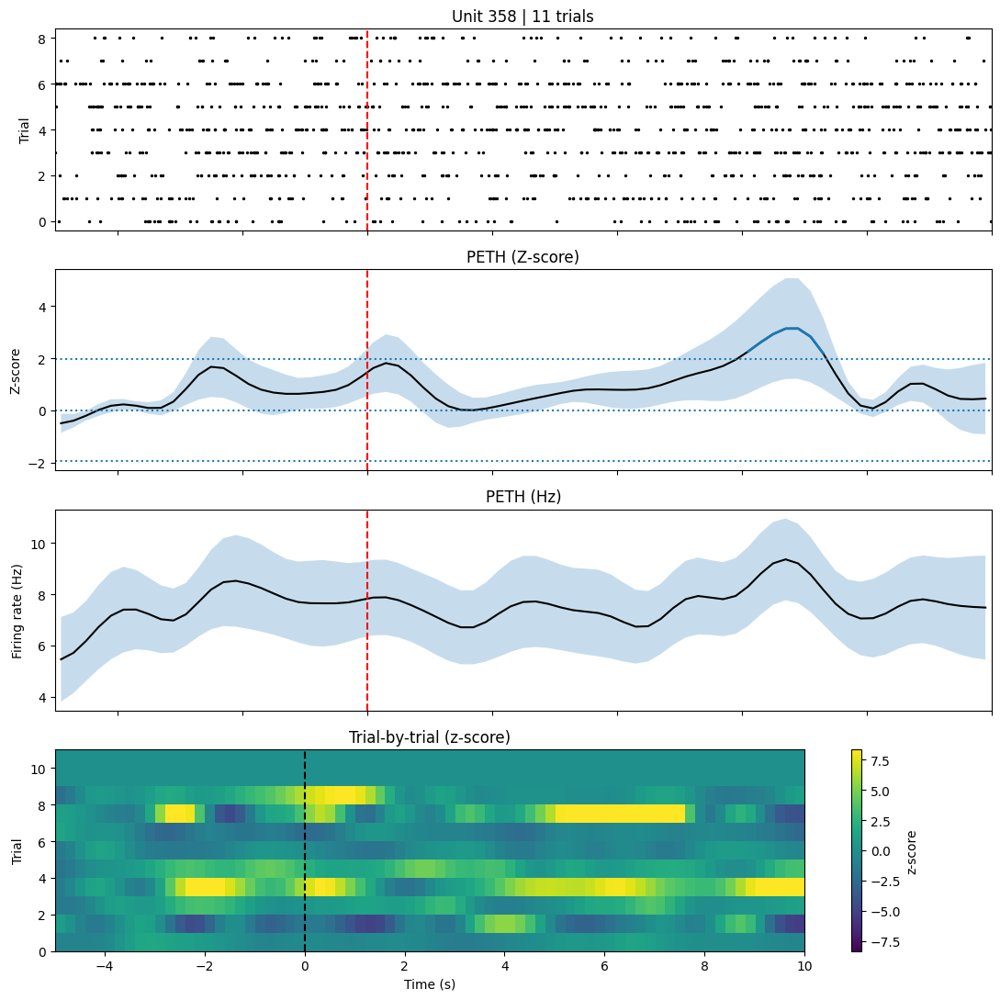

In [10]:
# ============================================================
# CELL C‑PLOT: PETH + RASTER + HEATMAP (PLOTTING ONLY)
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

# ============================================================
# TUNABLE PLOTTING PARAMETERS
# ============================================================

Z_THRESH = 1.96  ####################################################################################################################################################################################################################################################################################################
# Significance threshold for z-score PETH

HEATMAP_PERCENTILE = 97  #############################################################################################################################################################################################################################################################################################
# Color scaling for heatmap

# ============================================================
# PLOT EACH UNIT
# ============================================================

for unit, data in results.items():

    aligned_spikes = data["aligned_spikes"]
    trial_matrix   = data["trial_matrix"]
    trial_matrix_hz = data["trial_matrix_hz"]

    mean_peth = data["mean_peth"]
    sem_peth  = data["sem_peth"]

    mean_peth_hz = data["mean_peth_hz"]
    sem_peth_hz  = data["sem_peth_hz"]

    sig_pos = mean_peth > Z_THRESH
    sig_neg = mean_peth < -Z_THRESH

    fig, axes = plt.subplots(4, 1, figsize=(11, 11), sharex=True)
    ax_raster, ax_peth, ax_peth_hz, ax_heat = axes

    # Raster
    for i, trial in enumerate(aligned_spikes):
        ax_raster.scatter(trial, np.ones_like(trial)*i, s=2, c='k')
    ax_raster.axvline(0, color='r', linestyle='--')
    ax_raster.set_ylabel("Trial")
    ax_raster.set_title(f"Unit {unit} | {len(aligned_spikes)} trials")

    # Z-score PETH
    ax_peth.fill_between(bin_centers, mean_peth - sem_peth, mean_peth + sem_peth, alpha=0.25)
    ax_peth.plot(bin_centers, mean_peth, color='black', lw=1.5)
    ax_peth.plot(bin_centers[sig_pos], mean_peth[sig_pos], lw=2)
    ax_peth.plot(bin_centers[sig_neg], mean_peth[sig_neg], lw=2)
    ax_peth.axhline(0, linestyle=':')
    ax_peth.axhline(Z_THRESH, linestyle=':')
    ax_peth.axhline(-Z_THRESH, linestyle=':')
    ax_peth.axvline(0, color='r', linestyle='--')
    ax_peth.set_ylabel("Z-score")
    ax_peth.set_title("PETH (Z-score)")

    # Hz PETH
    ax_peth_hz.fill_between(bin_centers, mean_peth_hz - sem_peth_hz, mean_peth_hz + sem_peth_hz, alpha=0.25)
    ax_peth_hz.plot(bin_centers, mean_peth_hz, color='black', lw=1.5)
    ax_peth_hz.axvline(0, color='r', linestyle='--')
    ax_peth_hz.set_ylabel("Firing rate (Hz)")
    ax_peth_hz.set_title("PETH (Hz)")

    # Heatmap
    vmax = np.percentile(np.abs(trial_matrix), HEATMAP_PERCENTILE)
    im = ax_heat.imshow(
        trial_matrix,
        aspect='auto',
        origin='lower',
        extent=[-T_BEFORE, T_AFTER, 0, len(aligned_spikes)],
        vmin=-vmax,
        vmax=vmax
    )
    ax_heat.axvline(0, color='k', linestyle='--')
    ax_heat.set_xlabel("Time (s)")
    ax_heat.set_ylabel("Trial")
    ax_heat.set_title("Trial-by-trial (z-score)")
    plt.colorbar(im, ax=ax_heat, label='z-score')

    plt.tight_layout()
    plt.show()


In [12]:
# ============================================================
# CELL D‑COMPUTE: TTL + SPIKES + PETH (GLOBAL BASELINE VERSION)
# ============================================================

import numpy as np
from scipy.ndimage import gaussian_filter1d
import spikeinterface.extractors as se
import pandas as pd
import os

# ============================================================
# TUNABLE PARAMETERS (EDIT THESE ONLY)
# ============================================================

BIT_NUMBER = 7  ############################################################################################################################################################################################################################################################################
# TTL bit to extract

T_BEFORE = 5.0  ############################################################################################################################################################################################################################################################################
T_AFTER  = 10.0 ############################################################################################################################################################################################################################################################################
# PETH window around TTL

BIN_WIDTH = 0.2  ############################################################################################################################################################################################################################################################################
SIGMA_TRIAL = 2.0  ############################################################################################################################################################################################################################################################################
SIGMA_MEAN  = 5.0  ############################################################################################################################################################################################################################################################################
# Smoothing for trial-by-trial PETH and mean PETH

GLOBAL_BASELINE_DURATION = 120.0  ############################################################################################################################################################################################################################################################################
# First N seconds of recording used as global baseline

Z_THRESH = 1.96  ############################################################################################################################################################################################################################################################################
# Significance threshold for z-score PETH

MOD_WINDOW = (-0.5, 1.0)  ############################################################################################################################################################################################################################################################################
# Window used to sort trials by modulation strength

# ============================================================
# 1. LOAD TTL
# ============================================================

timestamps_ni = np.load(os.path.join(ni_folder, "timestamps.npy"))
full_words_ni = np.load(os.path.join(ni_folder, "full_words.npy"))

mask = 1 << BIT_NUMBER
bit_on = (full_words_ni & mask) > 0
bit_on_prev = np.roll(bit_on, 1)
bit_on_prev[0] = False

rising_idx = (~bit_on_prev) & (bit_on)
event_times = timestamps_ni[rising_idx]

print(f"TTL pulses extracted: {len(event_times)}")

# ============================================================
# 2. LOAD SORTING + CURATED GOOD UNITS
# ============================================================

sorting = se.read_phy(phy_path)

df = pd.read_csv(os.path.join(phy_path, "cluster_group.tsv"), sep="\t")
good_cluster_ids = set(df[df["group"] == "good"]["cluster_id"].values)

unit_ids_all = sorting.get_unit_ids()
good_units = [u for u in unit_ids_all if u in good_cluster_ids]

sorting_good = sorting.select_units(good_units)
unit_ids = sorting_good.get_unit_ids()
sf = sorting_good.get_sampling_frequency()

print(f"Good units: {len(unit_ids)}")

# ============================================================
# 3. PREPARE BINS + MODULATION MASK
# ============================================================

bins = np.arange(-T_BEFORE, T_AFTER + BIN_WIDTH, BIN_WIDTH)
bin_centers = bins[:-1] + BIN_WIDTH / 2
n_bins = len(bin_centers)

mod_mask = (bin_centers >= MOD_WINDOW[0]) & (bin_centers <= MOD_WINDOW[1])

# ============================================================
# 4. COMPUTE GLOBAL BASELINE PER UNIT
# ============================================================

def compute_global_baseline(spike_times):
    baseline_spikes = spike_times[spike_times < GLOBAL_BASELINE_DURATION]
    baseline_bins = np.arange(0, GLOBAL_BASELINE_DURATION + BIN_WIDTH, BIN_WIDTH)
    baseline_counts, _ = np.histogram(baseline_spikes, bins=baseline_bins)
    baseline_fr = baseline_counts / BIN_WIDTH
    baseline_fr_smooth = gaussian_filter1d(baseline_fr.astype(float), sigma=SIGMA_TRIAL)
    mu = baseline_fr_smooth.mean()
    sigma = baseline_fr_smooth.std()
    return mu, max(sigma, 1e-6)

# ============================================================
# 5. COMPUTE TRIAL MATRICES FOR EACH UNIT
# ============================================================

results_global = {}

for unit in unit_ids:

    spike_times = sorting_good.get_unit_spike_train(unit) / sf

    # ---- global baseline ----
    mu, sigma = compute_global_baseline(spike_times)

    trial_matrix = np.zeros((len(event_times), n_bins))       # z-score
    trial_matrix_hz = np.zeros((len(event_times), n_bins))    # Hz
    aligned_spikes = []

    for i, t in enumerate(event_times):

        rel = spike_times - t
        window = rel[(rel > -T_BEFORE) & (rel < T_AFTER)]
        aligned_spikes.append(window)

        counts, _ = np.histogram(window, bins=bins)
        fr = counts / BIN_WIDTH
        fr_smooth = gaussian_filter1d(fr.astype(float), sigma=SIGMA_TRIAL)

        trial_matrix_hz[i] = fr_smooth
        trial_matrix[i] = (fr_smooth - mu) / sigma

    # ---- sort trials by modulation ----
    modulation_strength = np.max(np.abs(trial_matrix[:, mod_mask]), axis=1)
    sort_idx = np.argsort(modulation_strength)[::-1]

    trial_matrix_sorted = trial_matrix[sort_idx]
    aligned_spikes_sorted = [aligned_spikes[i] for i in sort_idx]

    # ---- averages ----
    mean_peth = trial_matrix.mean(axis=0)
    sem_peth  = trial_matrix.std(axis=0) / np.sqrt(len(event_times))

    mean_peth_hz = gaussian_filter1d(trial_matrix_hz.mean(axis=0), sigma=SIGMA_MEAN)
    sem_peth_hz  = trial_matrix_hz.std(axis=0) / np.sqrt(len(event_times))

    results_global[unit] = {
        "aligned_spikes": aligned_spikes,
        "aligned_spikes_sorted": aligned_spikes_sorted,
        "trial_matrix": trial_matrix,
        "trial_matrix_sorted": trial_matrix_sorted,
        "trial_matrix_hz": trial_matrix_hz,
        "mean_peth": mean_peth,
        "sem_peth": sem_peth,
        "mean_peth_hz": mean_peth_hz,
        "sem_peth_hz": sem_peth_hz,
    }

print("✅ Global-baseline computation complete.")


TTL pulses extracted: 11
Good units: 82
✅ Global-baseline computation complete.


C:\Users\Shermanlab\AppData\Local\Temp\ipykernel_2416\2312387227.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(11, 11))


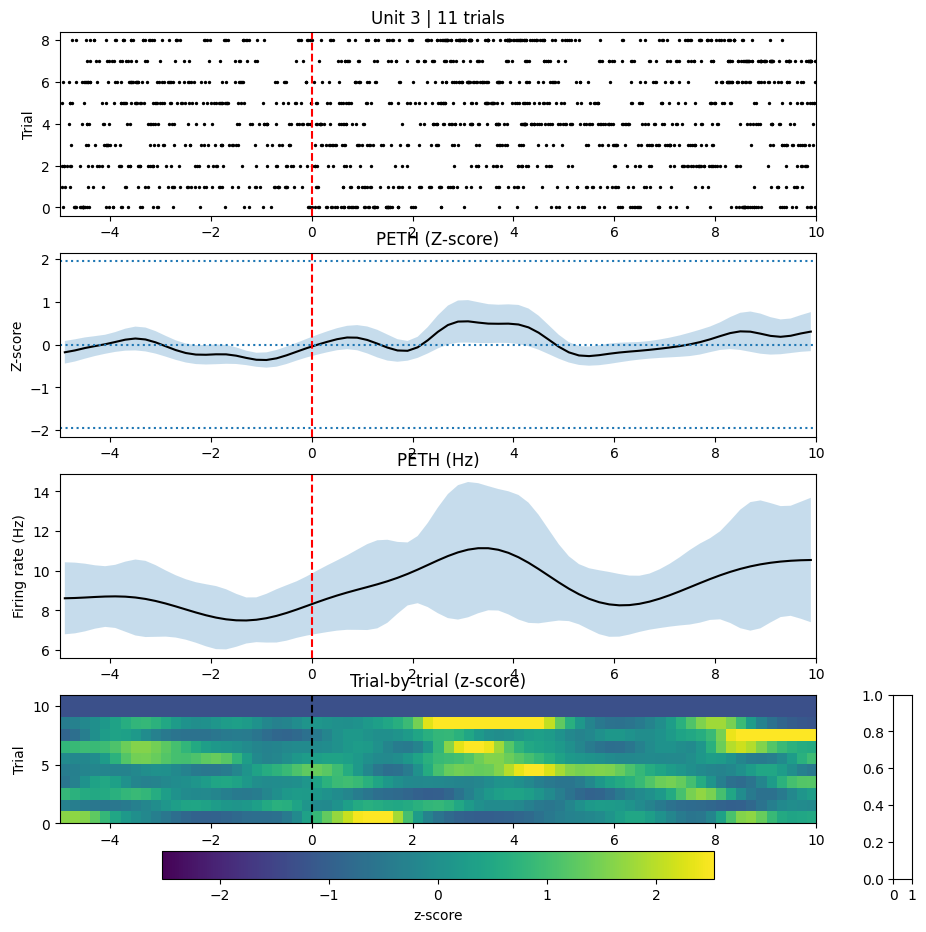

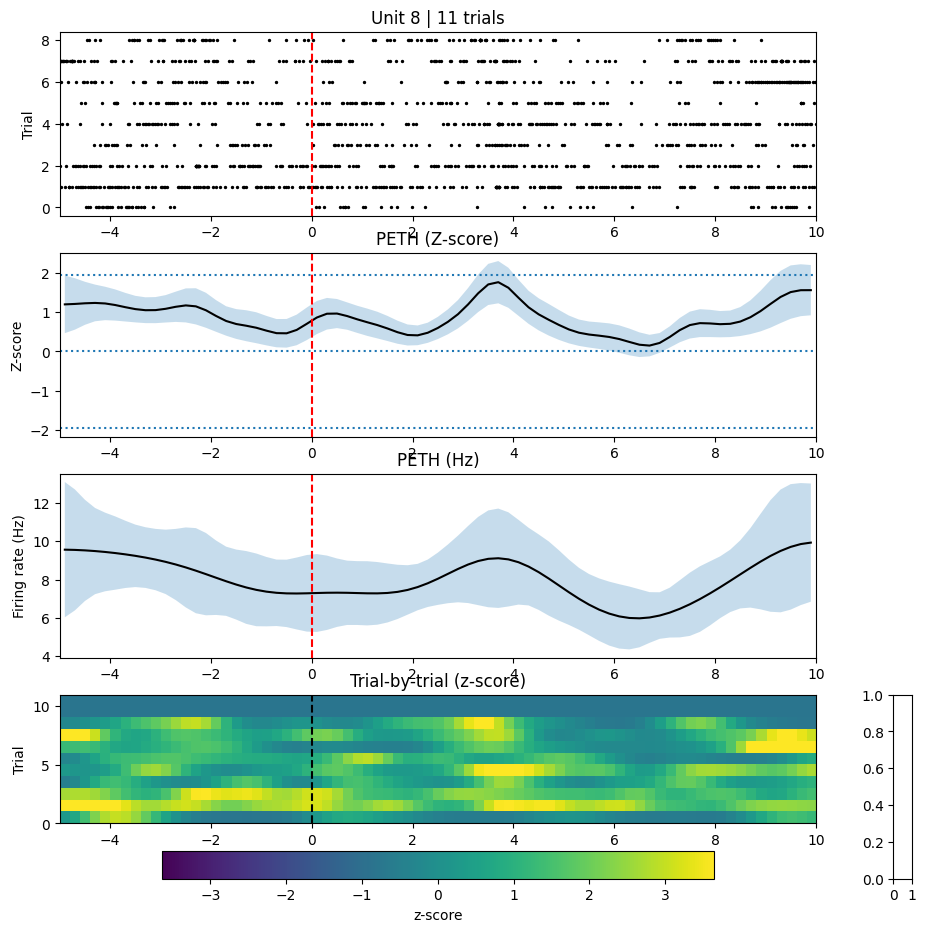

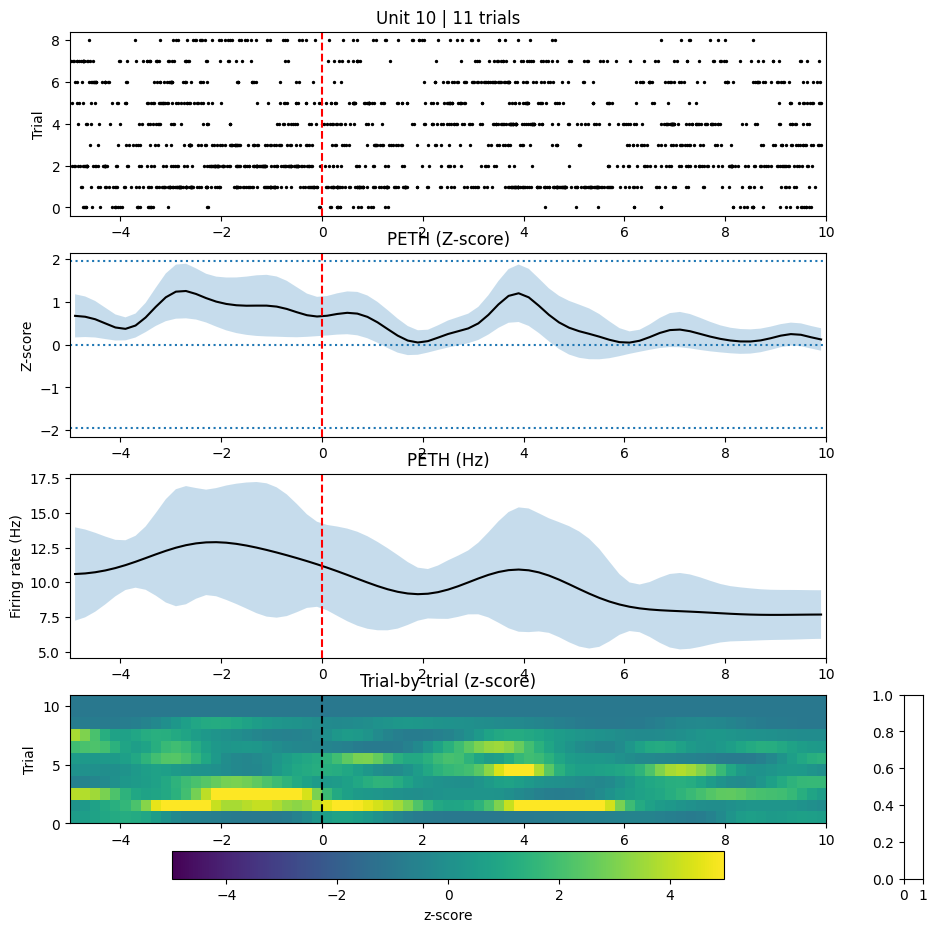

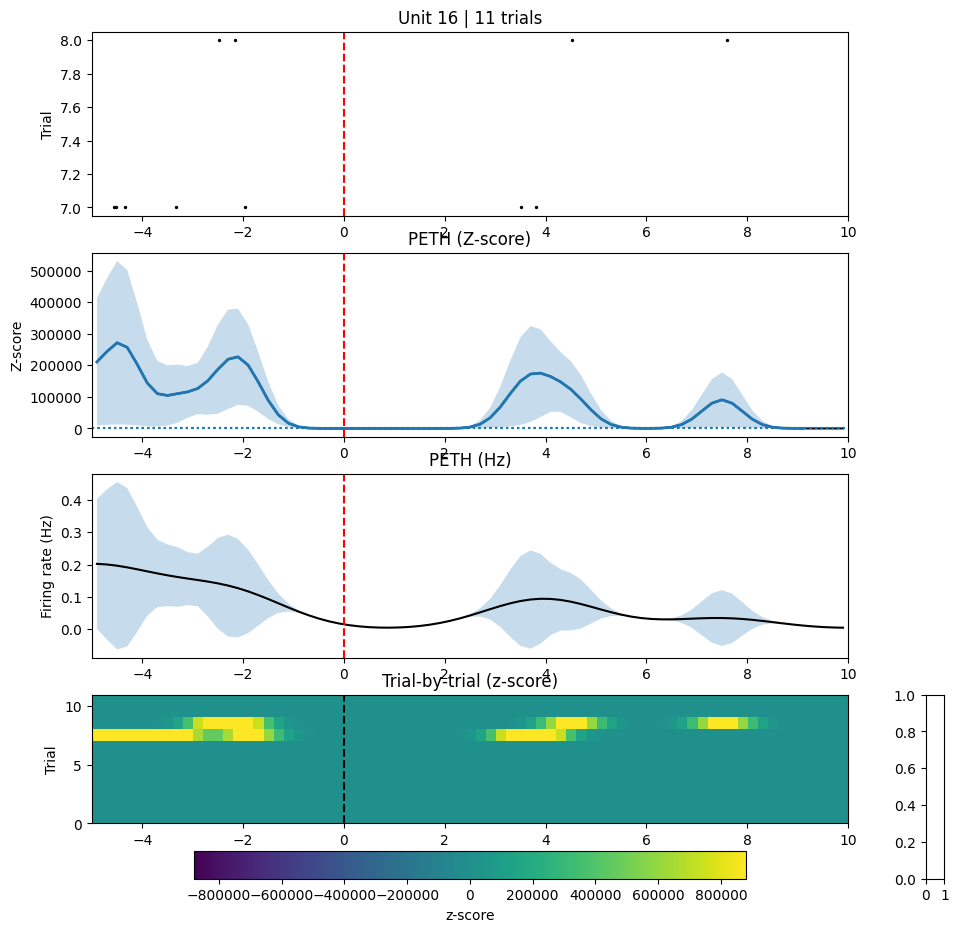

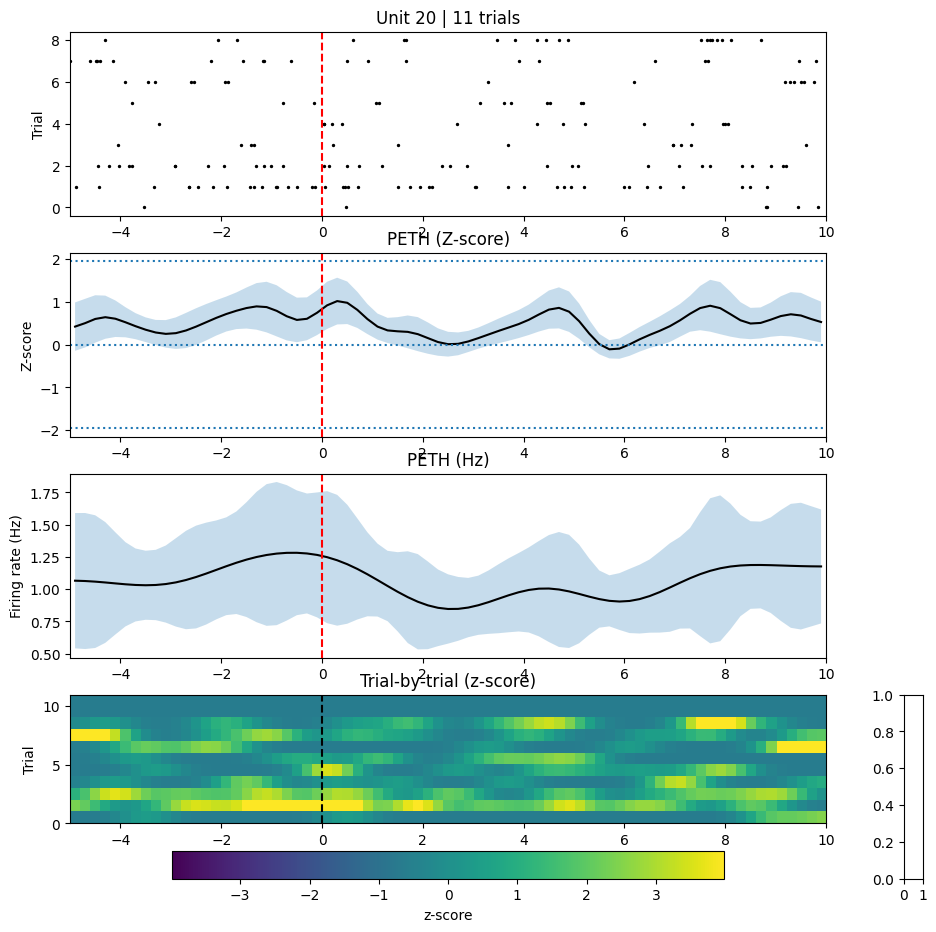

...

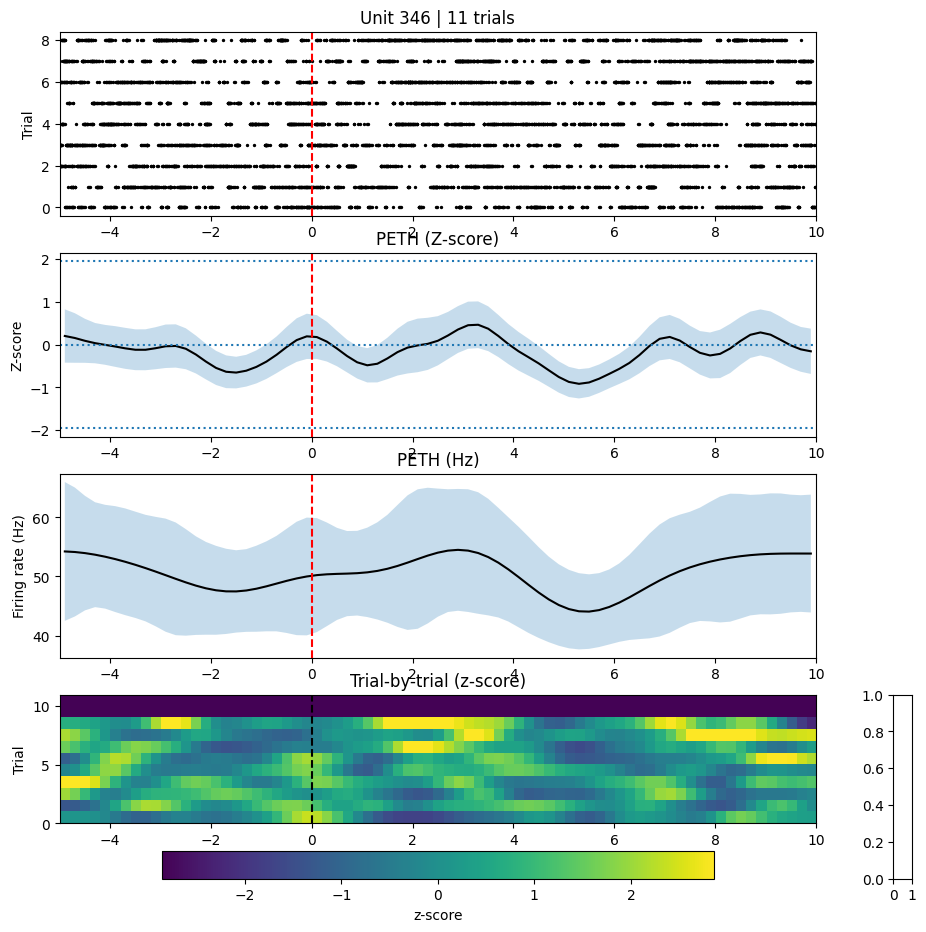

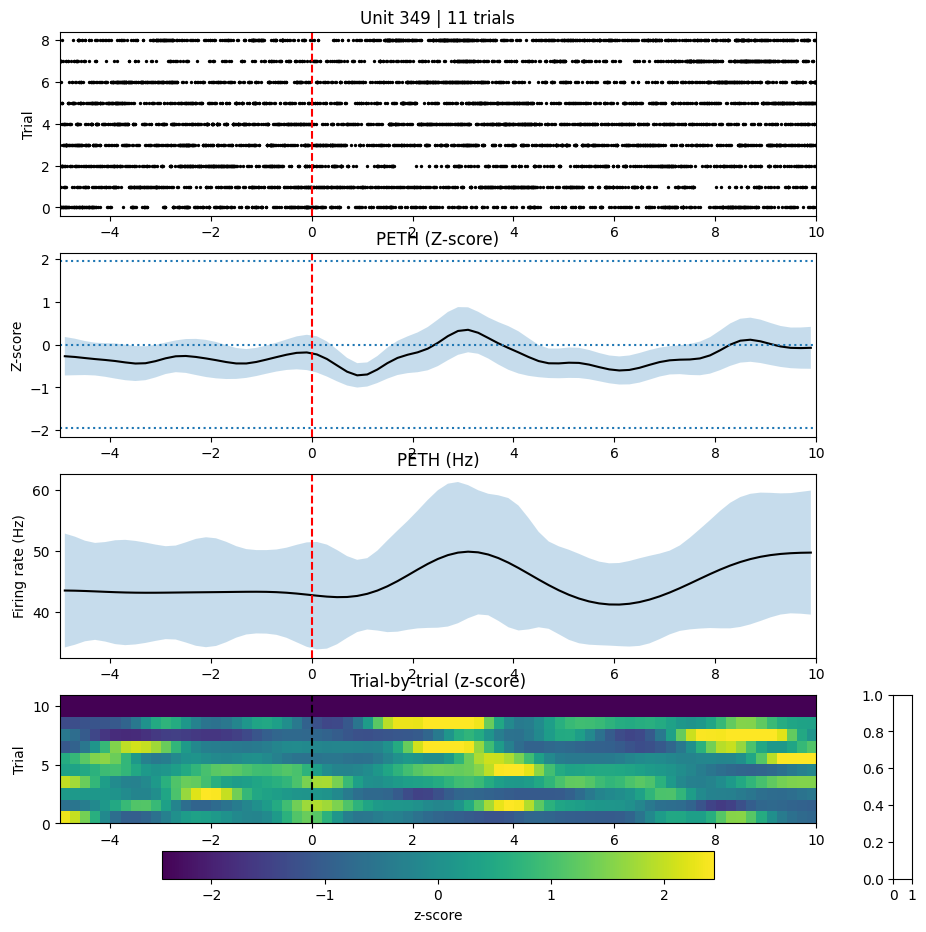

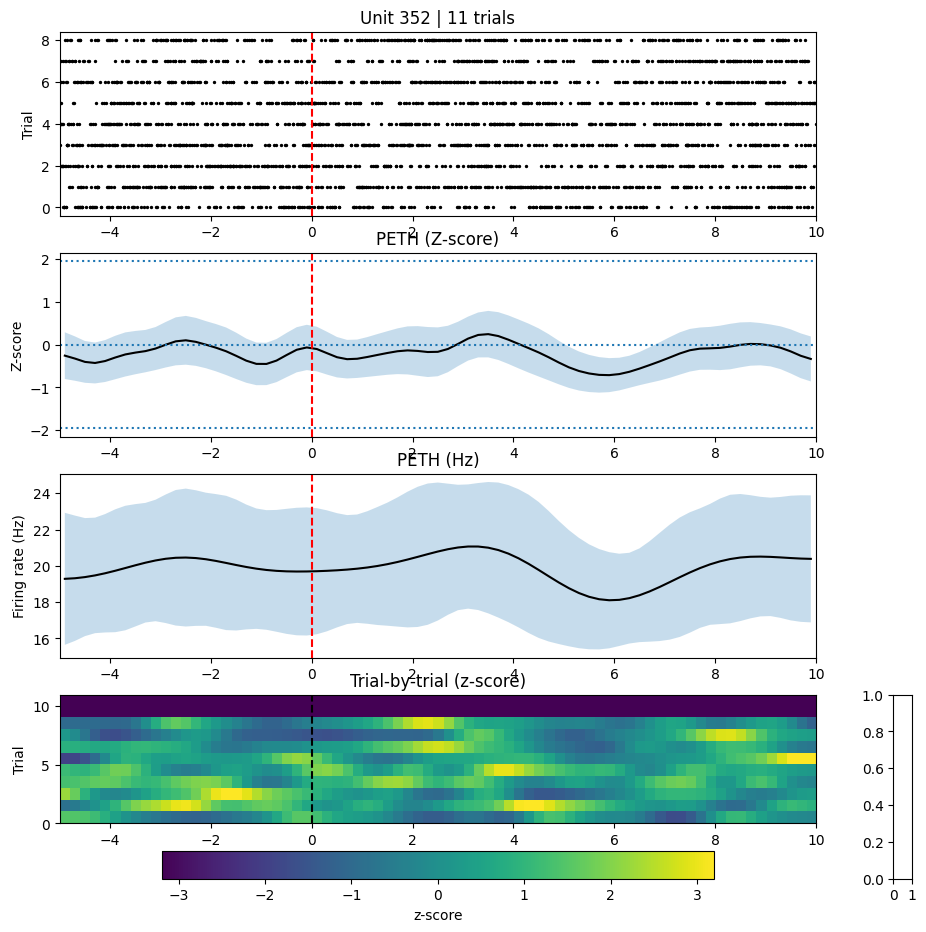

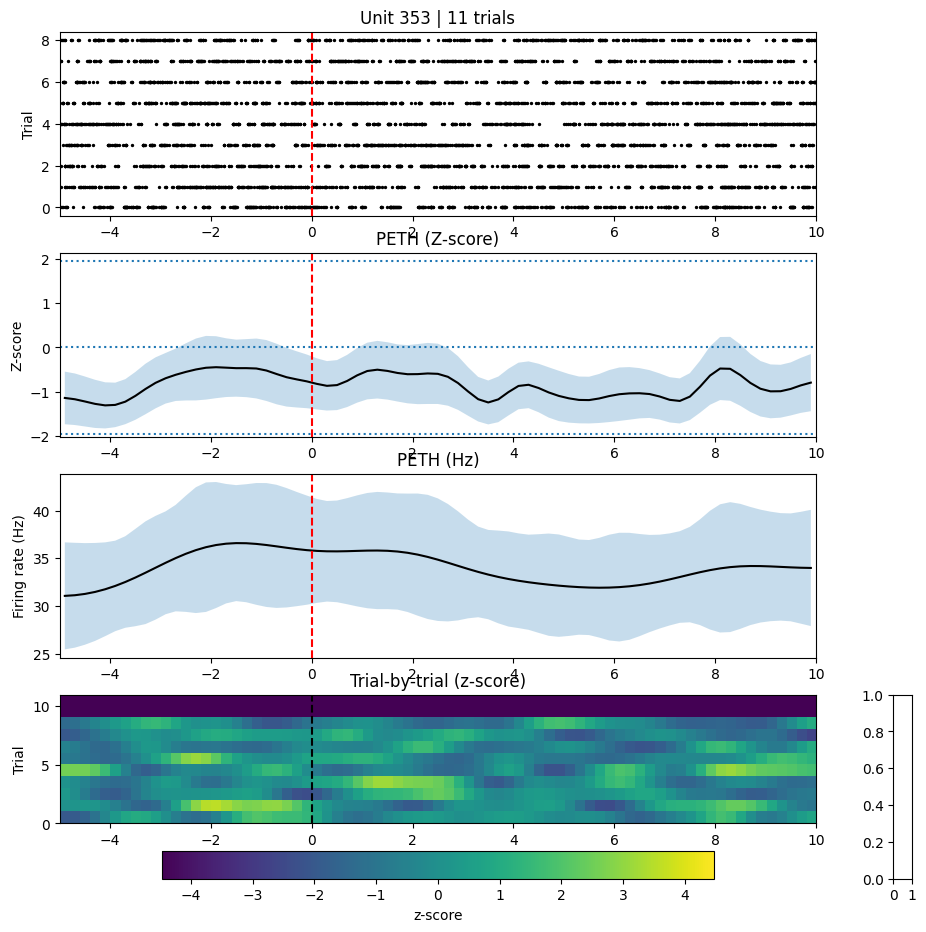

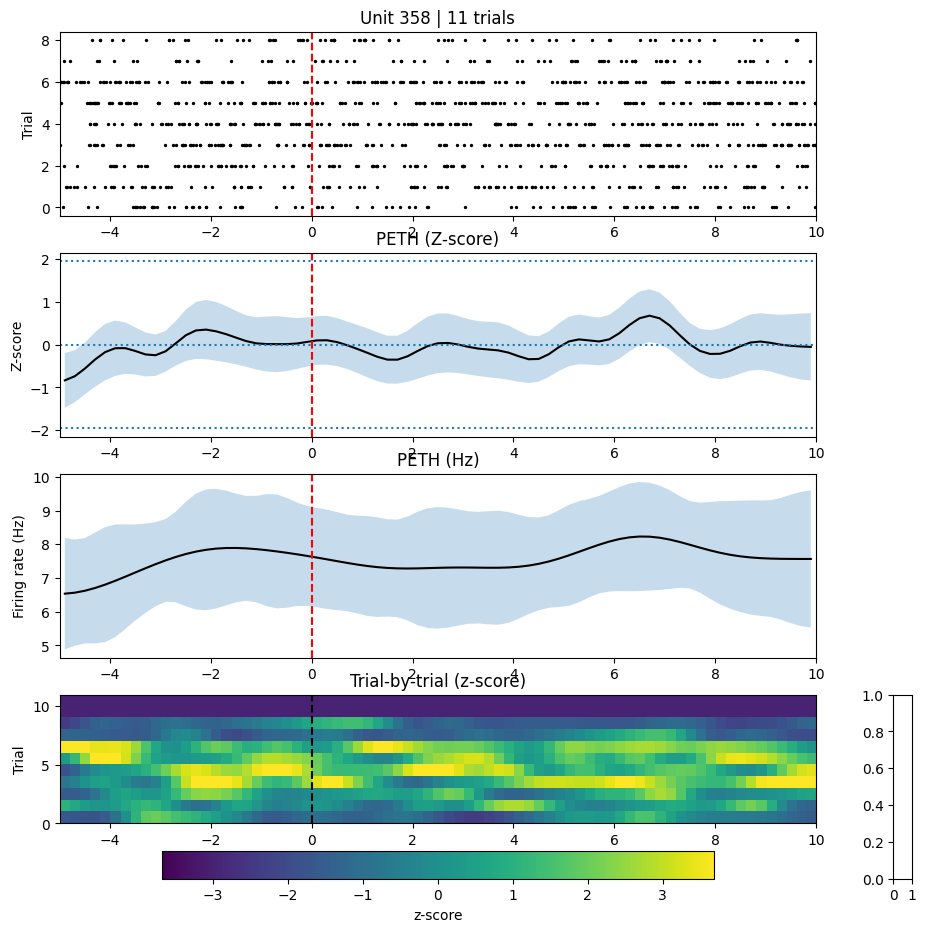

In [13]:
# ============================================================
# CELL D‑PLOT: PETH + RASTER + SORTED HEATMAP (GLOBAL BASELINE)
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

# ============================================================
# TUNABLE PLOTTING PARAMETERS
# ============================================================

Z_THRESH = 1.96  #################################################################################################################################################################################################
HEATMAP_PERCENTILE = 97  #################################################################################################################################################################################################
# Color scaling for heatmap

# ============================================================
# PLOT EACH UNIT
# ============================================================

for unit, data in results_global.items():

    aligned_spikes = data["aligned_spikes"]
    aligned_spikes_sorted = data["aligned_spikes_sorted"]
    trial_matrix = data["trial_matrix"]
    trial_matrix_sorted = data["trial_matrix_sorted"]
    trial_matrix_hz = data["trial_matrix_hz"]

    mean_peth = data["mean_peth"]
    sem_peth  = data["sem_peth"]

    mean_peth_hz = data["mean_peth_hz"]
    sem_peth_hz  = data["sem_peth_hz"]

    sig_pos = mean_peth > Z_THRESH
    sig_neg = mean_peth < -Z_THRESH

    fig = plt.figure(figsize=(11, 11))
    gs = fig.add_gridspec(4, 2, width_ratios=[40, 1])

    ax_raster = fig.add_subplot(gs[0, 0])
    ax_peth   = fig.add_subplot(gs[1, 0], sharex=ax_raster)
    ax_peth_hz= fig.add_subplot(gs[2, 0], sharex=ax_raster)
    ax_heat   = fig.add_subplot(gs[3, 0], sharex=ax_raster)
    cax       = fig.add_subplot(gs[3, 1])

    # ---- Raster ----
    for i, trial in enumerate(aligned_spikes):
        ax_raster.scatter(trial, np.ones_like(trial)*i, s=2, c='k')
    ax_raster.axvline(0, color='r', linestyle='--')
    ax_raster.set_ylabel("Trial")
    ax_raster.set_title(f"Unit {unit} | {len(aligned_spikes)} trials")

    # ---- Z-score PETH ----
    ax_peth.fill_between(bin_centers, mean_peth - sem_peth, mean_peth + sem_peth, alpha=0.25)
    ax_peth.plot(bin_centers, mean_peth, color='black', lw=1.5)
    ax_peth.plot(bin_centers[sig_pos], mean_peth[sig_pos], lw=2)
    ax_peth.plot(bin_centers[sig_neg], mean_peth[sig_neg], lw=2)
    ax_peth.axhline(0, linestyle=':')
    ax_peth.axhline(Z_THRESH, linestyle=':')
    ax_peth.axhline(-Z_THRESH, linestyle=':')
    ax_peth.axvline(0, color='r', linestyle='--')
    ax_peth.set_ylabel("Z-score")
    ax_peth.set_title("PETH (Z-score)")

    # ---- Hz PETH ----
    ax_peth_hz.fill_between(bin_centers, mean_peth_hz - sem_peth_hz, mean_peth_hz + sem_peth_hz, alpha=0.25)
    ax_peth_hz.plot(bin_centers, mean_peth_hz, color='black', lw=1.5)
    ax_peth_hz.axvline(0, color='r', linestyle='--')
    ax_peth_hz.set_ylabel("Firing rate (Hz)")
    ax_peth_hz.set_title("PETH (Hz)")

    # ---- Heatmap ----
    vmax = np.percentile(np.abs(trial_matrix), HEATMAP_PERCENTILE)
    im = ax_heat.imshow(
    trial_matrix,
    aspect='auto',
    origin='lower',
    extent=[-T_BEFORE, T_AFTER, 0, len(aligned_spikes)],
    vmin=-vmax,
    vmax=vmax
    )
    ax_heat.axvline(0, color='k', linestyle='--')
    ax_heat.set_xlabel("Time (s)")
    ax_heat.set_ylabel("Trial")
    ax_heat.set_title("Trial-by-trial (z-score)")

    # ---- Colorbar ABOVE heatmap ----
    cbar = fig.colorbar(im, ax=ax_heat, orientation='horizontal', pad=0.15)
    cbar.set_label("z-score")
